In [1]:
import nibabel as nb

In [2]:
import scipy as sp
from scipy import ndimage

01 [[ True  True  True  True]
 [ True  True  True False]
 [ True  True  True False]
 [ True  True  True  True]]
02 [[ True  True  True False]
 [ True  True  True False]
 [ True  True  True False]
 [ True  True  True  True]]
03 [[ True  True  True  True]
 [ True  True  True False]
 [ True  True  True False]
 [ True  True  True  True]]
04 [[ True  True  True  True]
 [ True  True  True False]
 [ True  True  True False]
 [ True  True  True  True]]
05 [[ True  True  True  True]
 [ True  True  True False]
 [ True  True  True False]
 [ True  True  True  True]]


/usr/local/lib/python2.7/dist-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


06 [[ True  True  True False]
 [ True  True  True False]
 [ True  True  True False]
 [ True  True  True  True]]
07 [[ True  True  True  True]
 [ True  True  True False]
 [ True  True  True False]
 [ True  True  True  True]]
08 [[ True  True  True  True]
 [ True  True  True False]
 [ True  True  True False]
 [ True  True  True  True]]
09 [[False False False  True]
 [False False False False]
 [False False False False]
 [ True  True  True  True]]
10 [[ True  True  True False]
 [ True  True  True False]
 [ True  True  True False]
 [ True  True  True  True]]
11 [[ True  True  True  True]
 [ True  True  True False]
 [ True  True  True False]
 [ True  True  True  True]]
12 [[ True  True  True  True]
 [ True  True  True False]
 [ True  True  True False]
 [ True  True  True  True]]
13 [[ True  True  True  True]
 [ True  True  True False]
 [ True  True  True False]
 [ True  True  True  True]]
14 [[ True  True  True False]
 [ True  True  True False]
 [ True  True  True False]
 [ True  True  True 

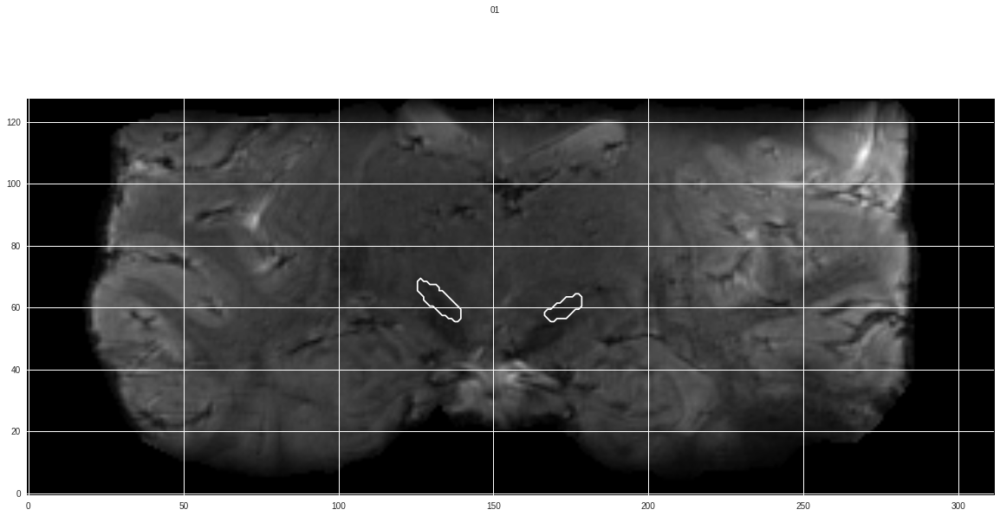

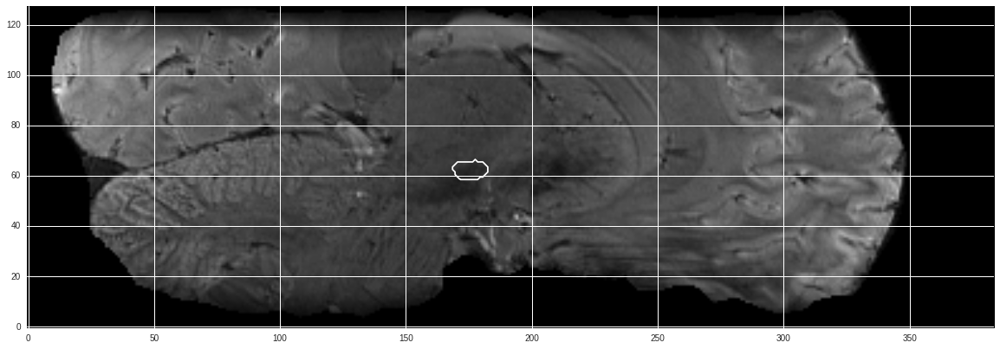

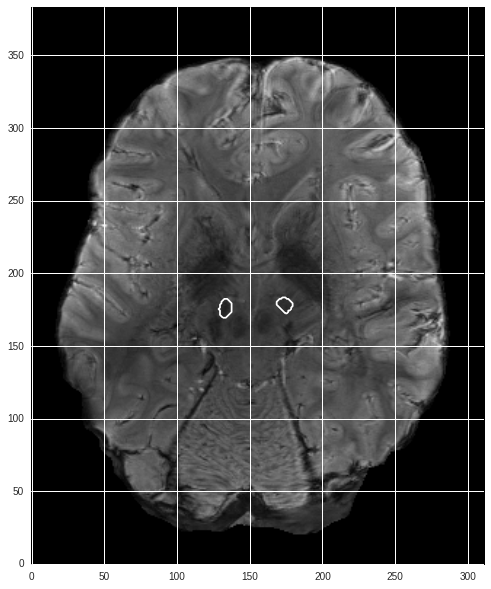

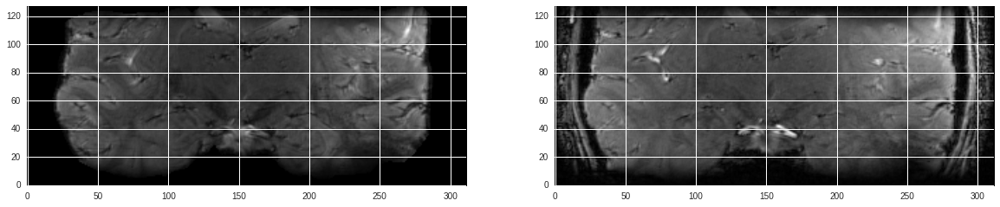

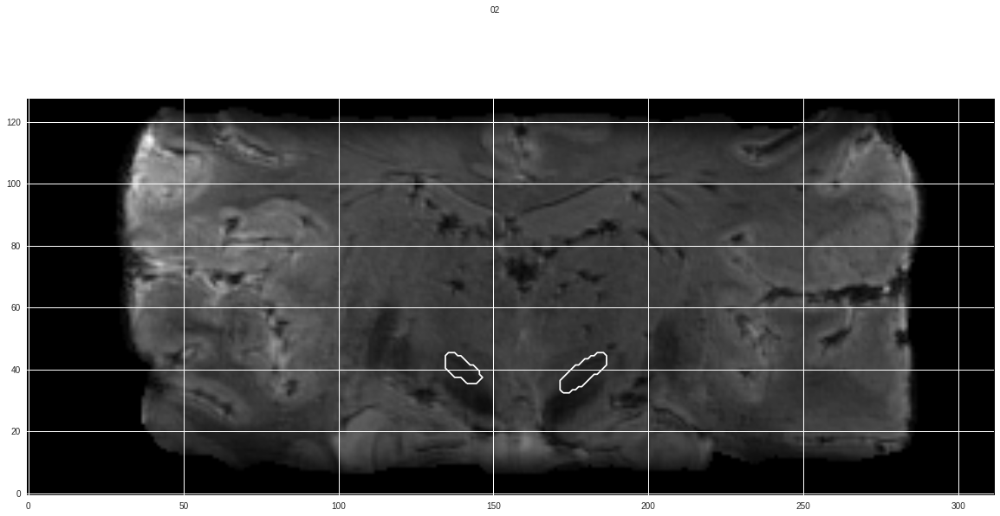

...

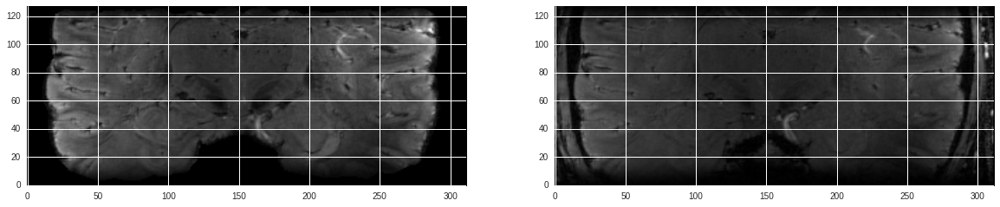

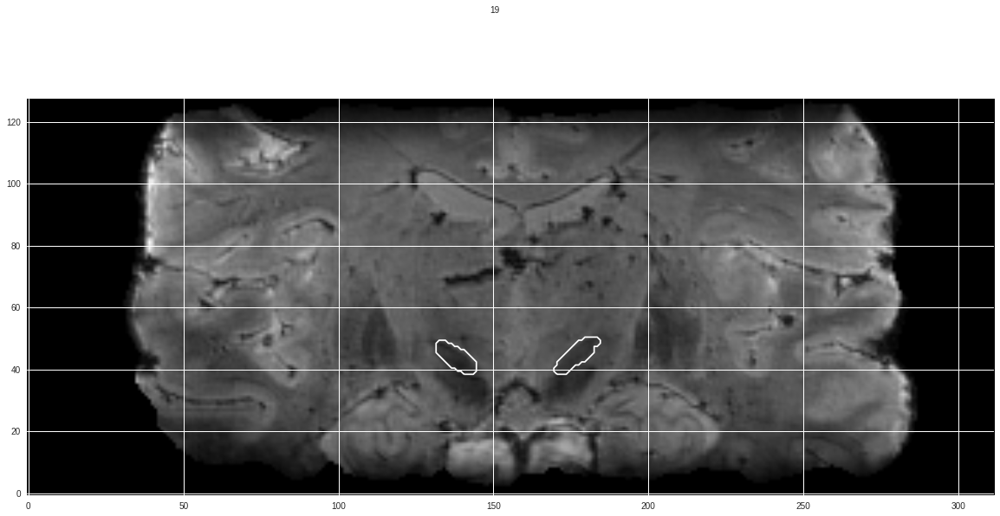

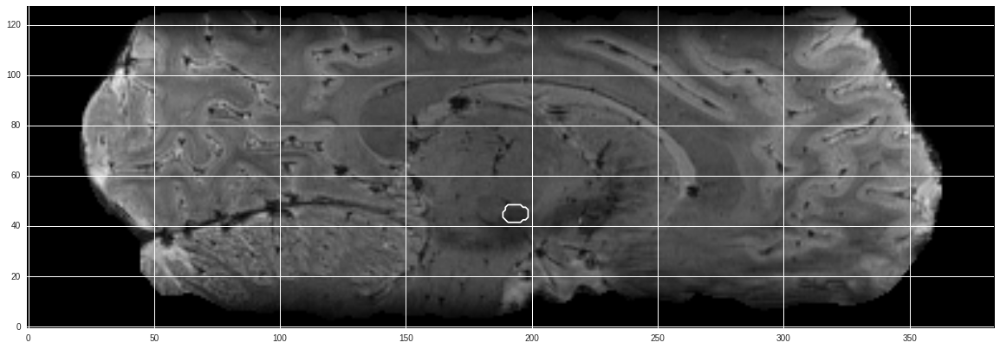

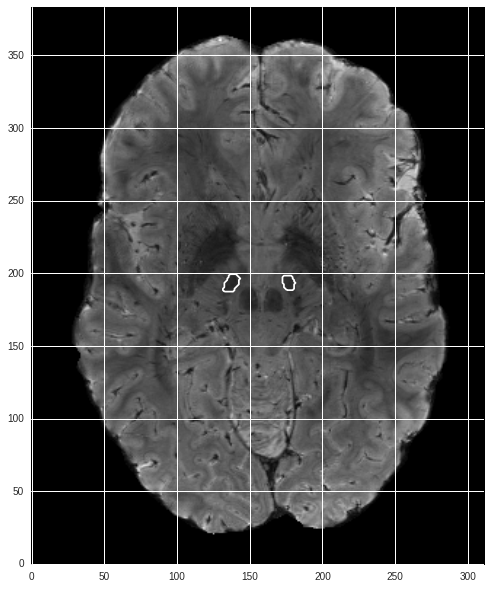

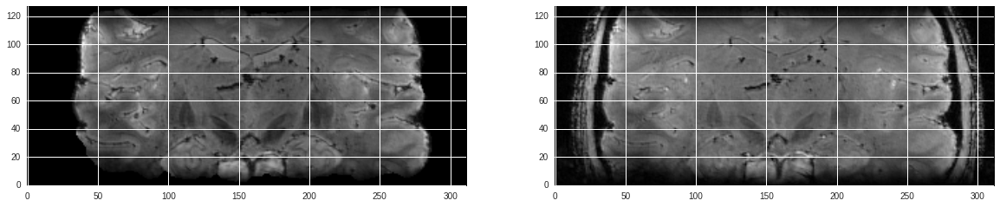

In [3]:
for subj_idx in ['%02d' % i for i in np.arange(1, 20)][:]:
    
    echo1 = nb.load('/home/gdholla1/projects/bias/data/raw/sub-{subj_idx}/anat/sub-{subj_idx}_FLASH_echo_11.22.nii.gz'.format(**locals()))
    mean_flash = nb.load('/home/gdholla1/projects/bias/data/derivatives/sub-{subj_idx}/mean_flash/sub-{subj_idx}_FLASH_echo_11.22_merged_mean_brain.nii.gz'.format(**locals()))
    stn_l = nb.load('/home/gdholla1/bias/data/derivatives/sub-{subj_idx}/masks/FLASH_space/sub-{subj_idx}_mask-STh_L.nii.gz'.format(**locals()))
    stn_r = nb.load('/home/gdholla1/bias/data/derivatives/sub-{subj_idx}/masks/FLASH_space/sub-{subj_idx}_mask-STh_R.nii.gz'.format(**locals()))
    
    com = ndimage.center_of_mass(stn_l.get_data())
    
    plt.figure(figsize=(20, 10))
    plt.suptitle(subj_idx)
    plt.imshow(mean_flash.get_data()[:, int(com[1]), :].T, origin='lower', cmap=plt.cm.gray)
    plt.contour(stn_l.get_data()[:, int(com[1]), :].T, origin='lower', levels=[0, 1])

    plt.imshow(mean_flash.get_data()[:, int(com[1]), :].T, origin='lower', cmap=plt.cm.gray)
    plt.contour(stn_r.get_data()[:, int(com[1]), :].T, origin='lower', levels=[0, 1])

    plt.figure(figsize=(20, 10))

    plt.imshow(mean_flash.get_data()[int(com[0]), :, :].T, origin='lower', cmap=plt.cm.gray)
    plt.contour(stn_l.get_data()[int(com[0]), :, :].T, origin='lower', levels=[0, 1])
    plt.contour(stn_r.get_data()[int(com[0]), :, :].T, origin='lower', levels=[0, 1])


    plt.figure(figsize=(20, 10))

    plt.imshow(mean_flash.get_data()[:, :, int(com[2])].T, origin='lower', cmap=plt.cm.gray)
    plt.contour(stn_l.get_data()[:, :, int(com[2])].T, origin='lower', levels=[0, 1])
    plt.contour(stn_r.get_data()[:, :, int(com[2])].T, origin='lower', levels=[0, 1])

    plt.figure(figsize=(20, 10))
    plt.subplot(121)
    plt.imshow(mean_flash.get_data()[:, int(com[1]), :].T, origin='lower', cmap=plt.cm.gray)
    plt.subplot(122)
    plt.imshow(echo1.get_data()[:, int(com[1]), :].T, origin='lower', cmap=plt.cm.gray)
    
    print subj_idx, echo1.affine == mean_flash.affine